<a href="https://colab.research.google.com/github/LUS24/reinforcement_learning/blob/main/notebooks/Gym_OpenAI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Gym - OpenAI

Esta libreria proporciona una coleccion de **environments** para desarrollar un proyecto de reinforcement learning. El **agente** no esta incluido, uno lo debe programar y en ese sentido es agnostico.

In [1]:
# Instalacion de librerias para la visualizacion de resultados en Google Colab
!apt update > /dev/null 2>&1
!apt install xvfb > /dev/null 2>&1
!pip install pyvirtualdisplay > /dev/null 2>&1

In [2]:
# Reinforcement Learning
import gym

# Visualizacion
from IPython import display
from pyvirtualdisplay import Display
import matplotlib.pyplot as plt
from matplotlib import animation

In [3]:
d = Display()
d.start()

## El Environment


Todos los Environments descienden de la clase base **Env**.

[Lista de environments](https://gym.openai.com/envs/#classic_control)

In [4]:
# Selecciono el ENVIRONMENT en donde quiero entrenar mi agente. 
env = gym.make('CartPole-v0')

In [5]:
# El espacio "Discrete" permite un rango fijo de valores no negativos.
# En este caso las acciones validas en un espacio "Discrete(2)" son o bien "0" o "1" 
print(env.action_space)

Discrete(2)


In [6]:
# El espacio "Box" representa un espacio n-dimensional.
# Los valores validos seran un array de 4 numeros
print(env.observation_space)

Box(-3.4028234663852886e+38, 3.4028234663852886e+38, (4,), float32)


In [7]:
# Tambien se puede chequear el rango de valores de "Box"

print(env.observation_space.low)
print(env.observation_space.high)

[-4.8000002e+00 -3.4028235e+38 -4.1887903e-01 -3.4028235e+38]
[4.8000002e+00 3.4028235e+38 4.1887903e-01 3.4028235e+38]


In [8]:
img = []
for i_episode in range(10):
    observation = env.reset()
    for t in range(100):
        print(observation)
        action = env.action_space.sample() # Take action from DNN in actual training.
        observation, reward, done, info = env.step(action)
        display.clear_output(wait=True)
        img.append(env.render('rgb_array'))
        #if done:
        #    print("Episode finished after {} timesteps".format(t+1))
        #    break
env.close()

[ 3.49368001  3.59873423 -7.50770158 -6.14127359]


## Visualizacion del resultado



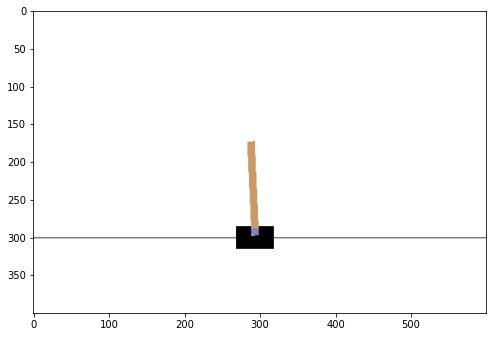

In [9]:
dpi = 72
interval = 50 # ms

plt.figure(figsize=(img[0].shape[1]/dpi,img[0].shape[0]/dpi),dpi=dpi)
patch = plt.imshow(img[0])
plt.axis=('off')
animate = lambda i: patch.set_data(img[i])
ani = animation.FuncAnimation(plt.gcf(),animate,frames=len(img),interval=interval)
display.display(display.HTML(ani.to_jshtml()))

# CartPole-v0

## [DQNCartPoleSolver](https://gym.openai.com/evaluations/eval_EIcM1ZBnQW2LBaFN6FY65g/)

In [10]:
# Inspired by https://keon.io/deep-q-learning/

import random
import gym
import math
import numpy as np
from collections import deque
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam

In [11]:
class DQNCartPoleSolver():
    def __init__(self, n_episodes=1000, n_win_ticks=195, max_env_steps=None, gamma=1.0, epsilon=1.0, epsilon_min=0.01, epsilon_log_decay=0.995, alpha=0.01, alpha_decay=0.01, batch_size=64, monitor=False, quiet=False):
        self.memory = deque(maxlen=100000)
        self.env = gym.make('CartPole-v0')
        if monitor: self.env = gym.wrappers.Monitor(self.env, '../data/cartpole-1', force=True)
        self.gamma = gamma
        self.epsilon = epsilon
        self.epsilon_min = epsilon_min
        self.epsilon_decay = epsilon_log_decay
        self.alpha = alpha
        self.alpha_decay = alpha_decay
        self.n_episodes = n_episodes
        self.n_win_ticks = n_win_ticks
        self.batch_size = batch_size
        self.quiet = quiet
        if max_env_steps is not None: self.env._max_episode_steps = max_env_steps

        # Init model
        self.model = Sequential()
        self.model.add(Dense(24, input_dim=4, activation='tanh'))
        self.model.add(Dense(48, activation='tanh'))
        self.model.add(Dense(2, activation='linear'))
        self.model.compile(loss='mse', optimizer=Adam(lr=self.alpha, decay=self.alpha_decay))

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def choose_action(self, state, epsilon):
        return self.env.action_space.sample() if (np.random.random() <= epsilon) else np.argmax(self.model.predict(state))

    def get_epsilon(self, t):
        return max(self.epsilon_min, min(self.epsilon, 1.0 - math.log10((t + 1) * self.epsilon_decay)))

    def preprocess_state(self, state):
        return np.reshape(state, [1, 4])

    def replay(self, batch_size):
        x_batch, y_batch = [], []
        minibatch = random.sample(
            self.memory, min(len(self.memory), batch_size))
        for state, action, reward, next_state, done in minibatch:
            y_target = self.model.predict(state)
            y_target[0][action] = reward if done else reward + self.gamma * np.max(self.model.predict(next_state)[0])
            x_batch.append(state[0])
            y_batch.append(y_target[0])
        
        self.model.fit(np.array(x_batch), np.array(y_batch), batch_size=len(x_batch), verbose=0)
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

    def run(self):
        scores = deque(maxlen=100)

        for e in range(self.n_episodes):
            state = self.preprocess_state(self.env.reset())
            done = False
            i = 0
            while not done:
                action = self.choose_action(state, self.get_epsilon(e))
                next_state, reward, done, _ = self.env.step(action)
                next_state = self.preprocess_state(next_state)
                self.remember(state, action, reward, next_state, done)
                state = next_state
                i += 1

            scores.append(i)
            mean_score = np.mean(scores)
            if mean_score >= self.n_win_ticks and e >= 100:
                if not self.quiet: print('Ran {} episodes. Solved after {} trials ✔'.format(e, e - 100))
                return e - 100
            if e % 100 == 0 and not self.quiet:
                print('[Episode {}] - Mean survival time over last 100 episodes was {} ticks.'.format(e, mean_score))

            self.replay(self.batch_size)
        
        if not self.quiet: print('Did not solve after {} episodes 😞'.format(e))
        return e

In [ ]:
agent = DQNCartPoleSolver()
agent.run()

[Episode 0] - Mean survival time over last 100 episodes was 66.0 ticks.
[Episode 100] - Mean survival time over last 100 episodes was 24.23 ticks.
[Episode 200] - Mean survival time over last 100 episodes was 49.89 ticks.
[Episode 300] - Mean survival time over last 100 episodes was 100.07 ticks.
[Episode 400] - Mean survival time over last 100 episodes was 112.67 ticks.
[Episode 500] - Mean survival time over last 100 episodes was 169.82 ticks.
[Episode 600] - Mean survival time over last 100 episodes was 151.22 ticks.
[Episode 700] - Mean survival time over last 100 episodes was 145.03 ticks.
[Episode 800] - Mean survival time over last 100 episodes was 140.38 ticks.
[Episode 900] - Mean survival time over last 100 episodes was 138.97 ticks.
